In [1]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
import lime
import lime.lime_tabular
import shap
import numpy as np

# Assuming the preprocessed dataset is saved as 'processed_dataset.csv'
df_processed = pd.read_csv('processed_dataset.csv')

# Step 1: Define Features (X) and Target (y)
X = df_processed.drop(columns=['legitimate'])  # Features (all columns except 'legitimate')
y = df_processed['legitimate']  # Target variable

# Step 2: Convert the target variable to binary (if continuous)
if y.dtype != 'int64' and y.dtype != 'int32':
    y = (y > 0.5).astype(int)  # Assuming a binary target variable

# Step 3: Create polynomial features (optional)
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X)

# Step 4: Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

# Step 5: Initialize the Logistic Regression model
model_lr = LogisticRegression(random_state=42, max_iter=5000, solver='liblinear')

# Step 6: Perform cross-validation (e.g., 5-Fold Cross Validation)
cv_scores_lr = cross_val_score(model_lr, X_train, y_train, cv=5)

# Display the cross-validation scores and average score
print(f"Logistic Regression Cross-validation scores: {cv_scores_lr}")
print(f"Average Logistic Regression cross-validation score: {cv_scores_lr.mean():.2f}")

# Step 7: Train the Logistic Regression model on the training set
model_lr.fit(X_train, y_train)

# Step 8: Make predictions on the test set
y_pred_lr = model_lr.predict(X_test)
y_pred_proba_lr = model_lr.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Step 9: Evaluate the Logistic Regression model's performance
accuracy_lr = accuracy_score(y_test, y_pred_lr)
precision_lr = precision_score(y_test, y_pred_lr)
recall_lr = recall_score(y_test, y_pred_lr)
f1_lr = f1_score(y_test, y_pred_lr)
mse_lr = mean_squared_error(y_test, y_pred_lr)
r_squared_lr = r2_score(y_test, y_pred_proba_lr)

print("\nLogistic Regression Model Performance on Test Set:")
print(f"Accuracy: {accuracy_lr:.2f}")
print(f"Precision: {precision_lr:.2f}")
print(f"Recall: {recall_lr:.2f}")
print(f"F1 Score: {f1_lr:.2f}")
print(f"Mean Squared Error: {mse_lr:.2f}")
print(f"R-squared: {r_squared_lr:.2f}")

# Step 10: Generate a detailed classification report
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))

# Step 11: Display the confusion matrix
cm_lr = confusion_matrix(y_test, y_pred_lr)
print("\nLogistic Regression Confusion Matrix:")
print(cm_lr)

# Optional: Try Random Forest as an alternative model
model_rf = RandomForestClassifier(n_estimators=100, random_state=42)
model_rf.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = model_rf.predict(X_test)
y_pred_proba_rf = model_rf.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Evaluate the Random Forest model's performance
accuracy_rf = accuracy_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
recall_rf = recall_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r_squared_rf = r2_score(y_test, y_pred_proba_rf)

print("\nRandom Forest Model Performance on Test Set:")
print(f"Accuracy: {accuracy_rf:.2f}")
print(f"Precision: {precision_rf:.2f}")
print(f"Recall: {recall_rf:.2f}")
print(f"F1 Score: {f1_rf:.2f}")
print(f"Mean Squared Error: {mse_rf:.2f}")
print(f"R-squared: {r_squared_rf:.2f}")

# Generate a detailed classification report for Random Forest
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

# Display the confusion matrix for Random Forest
cm_rf = confusion_matrix(y_test, y_pred_rf)
print("\nRandom Forest Confusion Matrix:")
print(cm_rf)

# ==============================
# LIME Explanation for Random Forest
# ==============================

# Initialize LIME explainer for Random Forest
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, mode='classification', 
                                                   feature_names=df_processed.columns.drop('legitimate'), 
                                                   class_names=['Not Legitimate', 'Legitimate'], 
                                                   discretize_continuous=True)

# Explain a single prediction (e.g., the first instance in the test set)
i = 0  # Index of the instance you want to explain
exp = explainer.explain_instance(X_test[i], model_rf.predict_proba, num_features=10)

# Display the explanation in notebook (or use exp.as_list() for a text version)
exp.show_in_notebook(show_table=True)

# ==============================
# SHAP Explanation for Logistic Regression
# ==============================

# Create SHAP explainer for Logistic Regression
explainer_lr = shap.LinearExplainer(model_lr, X_train, feature_perturbation="interventional")
shap_values_lr = explainer_lr.shap_values(X_test)

# Plot SHAP summary plot for Logistic Regression
shap.summary_plot(shap_values_lr, X_test, feature_names=df_processed.columns.drop('legitimate'))

# ==============================
# SHAP Explanation for Random Forest
# ==============================

# Create SHAP explainer for Random Forest
explainer_rf = shap.TreeExplainer(model_rf)
shap_values_rf = explainer_rf.shap_values(X_test)

# Plot SHAP summary plot for Random Forest
shap.summary_plot(shap_values_rf[1], X_test, feature_names=df_processed.columns.drop('legitimate'))

# Explain individual instance for Random Forest
shap.force_plot(explainer_rf.expected_value[1], shap_values_rf[1][i], X_test[i], feature_names=df_processed.columns.drop('legitimate'))


ModuleNotFoundError: No module named 'lime'

In [2]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
import lime
import lime.lime_tabular
import shap
import numpy as np

# Assuming the preprocessed dataset is saved as 'processed_dataset.csv'
df_processed = pd.read_csv('processed_dataset.csv')

# Step 1: Define Features (X) and Target (y)
X = df_processed.drop(columns=['legitimate'])  # Features (all columns except 'legitimate')
y = df_processed['legitimate']  # Target variable

# Step 2: Convert the target variable to binary (if continuous)
if y.dtype != 'int64' and y.dtype != 'int32':
    y = (y > 0.5).astype(int)  # Assuming a binary target variable

# Step 3: Create polynomial features (optional)
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X)

# Step 4: Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

# Step 5: Initialize the Logistic Regression model
model_lr = LogisticRegression(random_state=42, max_iter=5000, solver='liblinear')

# Step 6: Perform cross-validation (e.g., 5-Fold Cross Validation)
cv_scores_lr = cross_val_score(model_lr, X_train, y_train, cv=5)

# Display the cross-validation scores and average score
print(f"Logistic Regression Cross-validation scores: {cv_scores_lr}")
print(f"Average Logistic Regression cross-validation score: {cv_scores_lr.mean():.2f}")

# Step 7: Train the Logistic Regression model on the training set
model_lr.fit(X_train, y_train)

# Step 8: Make predictions on the test set
y_pred_lr = model_lr.predict(X_test)
y_pred_proba_lr = model_lr.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Step 9: Evaluate the Logistic Regression model's performance
accuracy_lr = accuracy_score(y_test, y_pred_lr)
precision_lr = precision_score(y_test, y_pred_lr)
recall_lr = recall_score(y_test, y_pred_lr)
f1_lr = f1_score(y_test, y_pred_lr)
mse_lr = mean_squared_error(y_test, y_pred_lr)
r_squared_lr = r2_score(y_test, y_pred_proba_lr)

print("\nLogistic Regression Model Performance on Test Set:")
print(f"Accuracy: {accuracy_lr:.2f}")
print(f"Precision: {precision_lr:.2f}")
print(f"Recall: {recall_lr:.2f}")
print(f"F1 Score: {f1_lr:.2f}")
print(f"Mean Squared Error: {mse_lr:.2f}")
print(f"R-squared: {r_squared_lr:.2f}")

# Step 10: Generate a detailed classification report
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))

# Step 11: Display the confusion matrix
cm_lr = confusion_matrix(y_test, y_pred_lr)
print("\nLogistic Regression Confusion Matrix:")
print(cm_lr)

# Optional: Try Random Forest as an alternative model
model_rf = RandomForestClassifier(n_estimators=100, random_state=42)
model_rf.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = model_rf.predict(X_test)
y_pred_proba_rf = model_rf.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Evaluate the Random Forest model's performance
accuracy_rf = accuracy_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
recall_rf = recall_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r_squared_rf = r2_score(y_test, y_pred_proba_rf)

print("\nRandom Forest Model Performance on Test Set:")
print(f"Accuracy: {accuracy_rf:.2f}")
print(f"Precision: {precision_rf:.2f}")
print(f"Recall: {recall_rf:.2f}")
print(f"F1 Score: {f1_rf:.2f}")
print(f"Mean Squared Error: {mse_rf:.2f}")
print(f"R-squared: {r_squared_rf:.2f}")

# Generate a detailed classification report for Random Forest
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

# Display the confusion matrix for Random Forest
cm_rf = confusion_matrix(y_test, y_pred_rf)
print("\nRandom Forest Confusion Matrix:")
print(cm_rf)

# ==============================
# LIME Explanation for Random Forest
# ==============================

# Initialize LIME explainer for Random Forest
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, mode='classification', 
                                                   feature_names=df_processed.columns.drop('legitimate'), 
                                                   class_names=['Not Legitimate', 'Legitimate'], 
                                                   discretize_continuous=True)

# Explain a single prediction (e.g., the first instance in the test set)
i = 0  # Index of the instance you want to explain
exp = explainer.explain_instance(X_test[i], model_rf.predict_proba, num_features=10)

# Display the explanation in notebook (or use exp.as_list() for a text version)
exp.show_in_notebook(show_table=True)

# ==============================
# SHAP Explanation for Logistic Regression
# ==============================

# Create SHAP explainer for Logistic Regression
explainer_lr = shap.LinearExplainer(model_lr, X_train, feature_perturbation="interventional")
shap_values_lr = explainer_lr.shap_values(X_test)

# Plot SHAP summary plot for Logistic Regression
shap.summary_plot(shap_values_lr, X_test, feature_names=df_processed.columns.drop('legitimate'))

# ==============================
# SHAP Explanation for Random Forest
# ==============================

# Create SHAP explainer for Random Forest
explainer_rf = shap.TreeExplainer(model_rf)
shap_values_rf = explainer_rf.shap_values(X_test)

# Plot SHAP summary plot for Random Forest
shap.summary_plot(shap_values_rf[1], X_test, feature_names=df_processed.columns.drop('legitimate'))

# Explain individual instance for Random Forest
shap.force_plot(explainer_rf.expected_value[1], shap_values_rf[1][i], X_test[i], feature_names=df_processed.columns.drop('legitimate'))


Logistic Regression Cross-validation scores: [0.9701648  0.96993843 0.96948431 0.9687599  0.96731109]
Average Logistic Regression cross-validation score: 0.97

Logistic Regression Model Performance on Test Set:
Accuracy: 0.97
Precision: 0.97
Recall: 0.93
F1 Score: 0.95
Mean Squared Error: 0.03
R-squared: 0.72

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     19250
           1       0.97      0.93      0.95      8360

    accuracy                           0.97     27610
   macro avg       0.97      0.96      0.96     27610
weighted avg       0.97      0.97      0.97     27610


Logistic Regression Confusion Matrix:
[[18984   266]
 [  559  7801]]

Random Forest Model Performance on Test Set:
Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00
Mean Squared Error: 0.00
R-squared: 1.00

Random Forest Classification Report:
              precision    recall  f1-score   support

         

IndexError: list index out of range

Logistic Regression Cross-validation scores: [0.9701648  0.96993843 0.96948431 0.9687599  0.96731109]
Average Logistic Regression cross-validation score: 0.97

Logistic Regression Model Performance on Test Set:
Accuracy: 0.97
Precision: 0.97
Recall: 0.93
F1 Score: 0.95
Mean Squared Error: 0.03
R-squared: 0.72

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     19250
           1       0.97      0.93      0.95      8360

    accuracy                           0.97     27610
   macro avg       0.97      0.96      0.96     27610
weighted avg       0.97      0.97      0.97     27610


Logistic Regression Confusion Matrix:
[[18984   266]
 [  559  7801]]

Random Forest Model Performance on Test Set:
Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00
Mean Squared Error: 0.00
R-squared: 1.00

Random Forest Classification Report:
              precision    recall  f1-score   support

         

C:\Users\adity\AppData\Local\Programs\Python\Python311\Lib\site-packages\shap\explainers\_linear.py:95: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


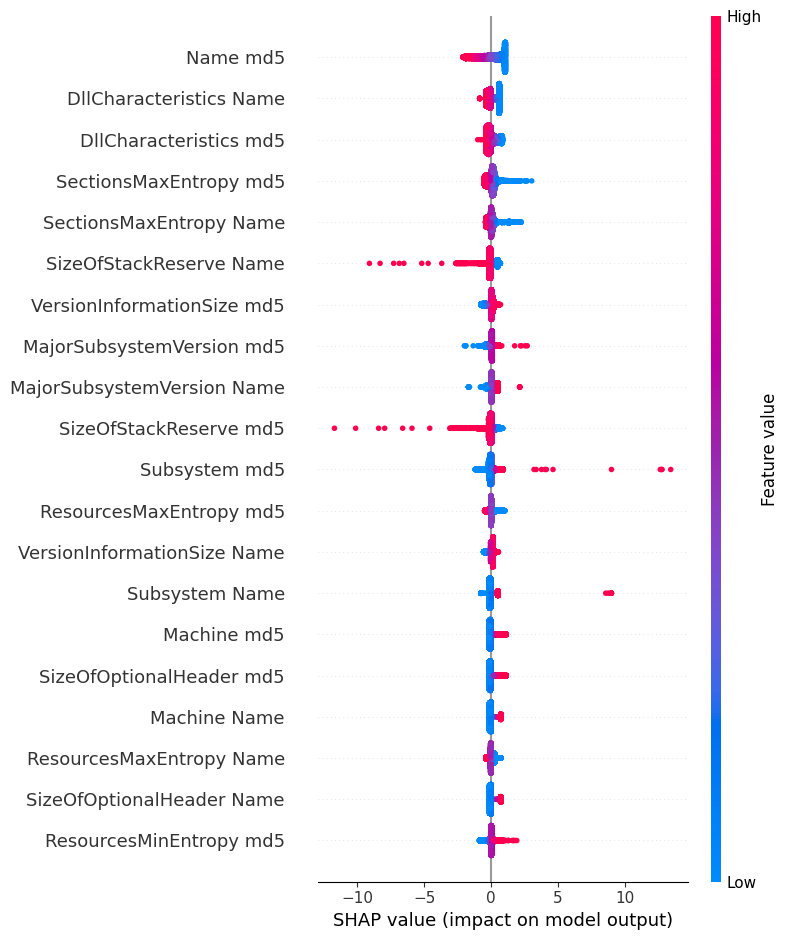

AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

In [3]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
import lime
import lime.lime_tabular
import shap
import numpy as np

# Assuming the preprocessed dataset is saved as 'processed_dataset.csv'
df_processed = pd.read_csv('processed_dataset.csv')

# Step 1: Define Features (X) and Target (y)
X = df_processed.drop(columns=['legitimate'])  # Features (all columns except 'legitimate')
y = df_processed['legitimate']  # Target variable

# Step 2: Convert the target variable to binary (if continuous)
if y.dtype != 'int64' and y.dtype != 'int32':
    y = (y > 0.5).astype(int)  # Assuming a binary target variable

# Step 3: Create polynomial features (optional)
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X)

# Step 4: Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

# Step 5: Initialize the Logistic Regression model
model_lr = LogisticRegression(random_state=42, max_iter=5000, solver='liblinear')

# Step 6: Perform cross-validation (e.g., 5-Fold Cross Validation)
cv_scores_lr = cross_val_score(model_lr, X_train, y_train, cv=5)

# Display the cross-validation scores and average score
print(f"Logistic Regression Cross-validation scores: {cv_scores_lr}")
print(f"Average Logistic Regression cross-validation score: {cv_scores_lr.mean():.2f}")

# Step 7: Train the Logistic Regression model on the training set
model_lr.fit(X_train, y_train)

# Step 8: Make predictions on the test set
y_pred_lr = model_lr.predict(X_test)
y_pred_proba_lr = model_lr.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Step 9: Evaluate the Logistic Regression model's performance
accuracy_lr = accuracy_score(y_test, y_pred_lr)
precision_lr = precision_score(y_test, y_pred_lr)
recall_lr = recall_score(y_test, y_pred_lr)
f1_lr = f1_score(y_test, y_pred_lr)
mse_lr = mean_squared_error(y_test, y_pred_lr)
r_squared_lr = r2_score(y_test, y_pred_proba_lr)

print("\nLogistic Regression Model Performance on Test Set:")
print(f"Accuracy: {accuracy_lr:.2f}")
print(f"Precision: {precision_lr:.2f}")
print(f"Recall: {recall_lr:.2f}")
print(f"F1 Score: {f1_lr:.2f}")
print(f"Mean Squared Error: {mse_lr:.2f}")
print(f"R-squared: {r_squared_lr:.2f}")

# Step 10: Generate a detailed classification report
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))

# Step 11: Display the confusion matrix
cm_lr = confusion_matrix(y_test, y_pred_lr)
print("\nLogistic Regression Confusion Matrix:")
print(cm_lr)

# Optional: Try Random Forest as an alternative model
model_rf = RandomForestClassifier(n_estimators=100, random_state=42)
model_rf.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = model_rf.predict(X_test)
y_pred_proba_rf = model_rf.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Evaluate the Random Forest model's performance
accuracy_rf = accuracy_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
recall_rf = recall_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r_squared_rf = r2_score(y_test, y_pred_proba_rf)

print("\nRandom Forest Model Performance on Test Set:")
print(f"Accuracy: {accuracy_rf:.2f}")
print(f"Precision: {precision_rf:.2f}")
print(f"Recall: {recall_rf:.2f}")
print(f"F1 Score: {f1_rf:.2f}")
print(f"Mean Squared Error: {mse_rf:.2f}")
print(f"R-squared: {r_squared_rf:.2f}")

# Generate a detailed classification report for Random Forest
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

# Display the confusion matrix for Random Forest
cm_rf = confusion_matrix(y_test, y_pred_rf)
print("\nRandom Forest Confusion Matrix:")
print(cm_rf)

# ==============================
# LIME Explanation for Random Forest
# ==============================

# Generate feature names for polynomial features
poly_feature_names = poly.get_feature_names_out(df_processed.columns.drop('legitimate'))

# Initialize LIME explainer for Random Forest using new feature names
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, mode='classification', 
                                                   feature_names=poly_feature_names, 
                                                   class_names=['Not Legitimate', 'Legitimate'], 
                                                   discretize_continuous=True)

# Explain a single prediction (e.g., the first instance in the test set)
i = 0  # Index of the instance you want to explain
exp = explainer.explain_instance(X_test[i], model_rf.predict_proba, num_features=10)

# Display the explanation in notebook (or use exp.as_list() for a text version)
exp.show_in_notebook(show_table=True)

# ==============================
# SHAP Explanation for Logistic Regression
# ==============================

# Create SHAP explainer for Logistic Regression
explainer_lr = shap.LinearExplainer(model_lr, X_train, feature_perturbation="interventional")
shap_values_lr = explainer_lr.shap_values(X_test)

# Plot SHAP summary plot for Logistic Regression
shap.summary_plot(shap_values_lr, X_test, feature_names=poly_feature_names)

# ==============================
# SHAP Explanation for Random Forest
# ==============================

# Create SHAP explainer for Random Forest
explainer_rf = shap.TreeExplainer(model_rf)
shap_values_rf = explainer_rf.shap_values(X_test)

# Plot SHAP summary plot for Random Forest
shap.summary_plot(shap_values_rf[1], X_test, feature_names=poly_feature_names)

# Explain individual instance for Random Forest
shap.force_plot(explainer_rf.expected_value[1], shap_values_rf[1][i], X_test[i], feature_names=poly_feature_names)


Logistic Regression Cross-validation scores: [0.9701648  0.96993843 0.96948431 0.9687599  0.96731109]
Average Logistic Regression cross-validation score: 0.97

Logistic Regression Model Performance on Test Set:
Accuracy: 0.97
Precision: 0.97
Recall: 0.93
F1 Score: 0.95
Mean Squared Error: 0.03
R-squared: 0.72

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     19250
           1       0.97      0.93      0.95      8360

    accuracy                           0.97     27610
   macro avg       0.97      0.96      0.96     27610
weighted avg       0.97      0.97      0.97     27610


Logistic Regression Confusion Matrix:
[[18984   266]
 [  559  7801]]

Random Forest Model Performance on Test Set:
Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00
Mean Squared Error: 0.00
R-squared: 1.00

Random Forest Classification Report:
              precision    recall  f1-score   support

         

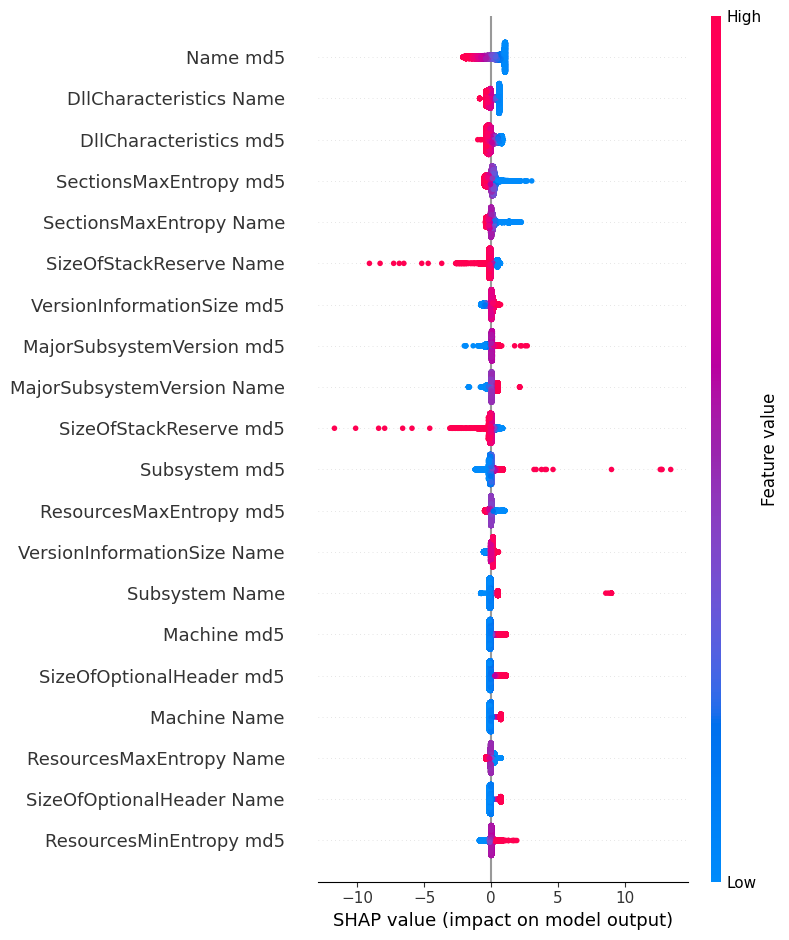

AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

In [4]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
import lime
import lime.lime_tabular
import shap
import numpy as np

# Assuming the preprocessed dataset is saved as 'processed_dataset.csv'
df_processed = pd.read_csv('processed_dataset.csv')

# Step 1: Define Features (X) and Target (y)
X = df_processed.drop(columns=['legitimate'])  # Features (all columns except 'legitimate')
y = df_processed['legitimate']  # Target variable

# Step 2: Convert the target variable to binary (if continuous)
if y.dtype != 'int64' and y.dtype != 'int32':
    y = (y > 0.5).astype(int)  # Assuming a binary target variable

# Step 3: Create polynomial features (optional)
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X)

# Step 4: Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

# Step 5: Initialize the Logistic Regression model
model_lr = LogisticRegression(random_state=42, max_iter=5000, solver='liblinear')

# Step 6: Perform cross-validation (e.g., 5-Fold Cross Validation)
cv_scores_lr = cross_val_score(model_lr, X_train, y_train, cv=5)

# Display the cross-validation scores and average score
print(f"Logistic Regression Cross-validation scores: {cv_scores_lr}")
print(f"Average Logistic Regression cross-validation score: {cv_scores_lr.mean():.2f}")

# Step 7: Train the Logistic Regression model on the training set
model_lr.fit(X_train, y_train)

# Step 8: Make predictions on the test set
y_pred_lr = model_lr.predict(X_test)
y_pred_proba_lr = model_lr.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Step 9: Evaluate the Logistic Regression model's performance
accuracy_lr = accuracy_score(y_test, y_pred_lr)
precision_lr = precision_score(y_test, y_pred_lr)
recall_lr = recall_score(y_test, y_pred_lr)
f1_lr = f1_score(y_test, y_pred_lr)
mse_lr = mean_squared_error(y_test, y_pred_lr)
r_squared_lr = r2_score(y_test, y_pred_proba_lr)

print("\nLogistic Regression Model Performance on Test Set:")
print(f"Accuracy: {accuracy_lr:.2f}")
print(f"Precision: {precision_lr:.2f}")
print(f"Recall: {recall_lr:.2f}")
print(f"F1 Score: {f1_lr:.2f}")
print(f"Mean Squared Error: {mse_lr:.2f}")
print(f"R-squared: {r_squared_lr:.2f}")

# Step 10: Generate a detailed classification report
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))

# Step 11: Display the confusion matrix
cm_lr = confusion_matrix(y_test, y_pred_lr)
print("\nLogistic Regression Confusion Matrix:")
print(cm_lr)

# Optional: Try Random Forest as an alternative model
model_rf = RandomForestClassifier(n_estimators=100, random_state=42)
model_rf.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = model_rf.predict(X_test)
y_pred_proba_rf = model_rf.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Evaluate the Random Forest model's performance
accuracy_rf = accuracy_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
recall_rf = recall_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r_squared_rf = r2_score(y_test, y_pred_proba_rf)

print("\nRandom Forest Model Performance on Test Set:")
print(f"Accuracy: {accuracy_rf:.2f}")
print(f"Precision: {precision_rf:.2f}")
print(f"Recall: {recall_rf:.2f}")
print(f"F1 Score: {f1_rf:.2f}")
print(f"Mean Squared Error: {mse_rf:.2f}")
print(f"R-squared: {r_squared_rf:.2f}")

# Generate a detailed classification report for Random Forest
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

# Display the confusion matrix for Random Forest
cm_rf = confusion_matrix(y_test, y_pred_rf)
print("\nRandom Forest Confusion Matrix:")
print(cm_rf)

# ==============================
# LIME Explanation for Random Forest
# ==============================

# Generate feature names for polynomial features
poly_feature_names = poly.get_feature_names_out(df_processed.columns.drop('legitimate'))

# Initialize LIME explainer for Random Forest using new feature names
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, mode='classification', 
                                                   feature_names=poly_feature_names, 
                                                   class_names=['Not Legitimate', 'Legitimate'], 
                                                   discretize_continuous=True)

# Explain a single prediction (e.g., the first instance in the test set)
i = 0  # Index of the instance you want to explain
exp = explainer.explain_instance(X_test[i], model_rf.predict_proba, num_features=10)

# Display the explanation in notebook (or use exp.as_list() for a text version)
exp.show_in_notebook(show_table=True)

# ==============================
# SHAP Explanation for Logistic Regression
# ==============================

import shap

# Use Independent masker for tabular data
masker_lr = shap.maskers.Independent(X_train)

# Create SHAP explainer for Logistic Regression
explainer_lr = shap.LinearExplainer(model_lr, masker_lr)
shap_values_lr = explainer_lr.shap_values(X_test)

# Plot SHAP summary plot for Logistic Regression
shap.summary_plot(shap_values_lr, X_test, feature_names=poly_feature_names)

# ==============================
# SHAP Explanation for Random Forest
# ==============================

# Create SHAP explainer for Random Forest
explainer_rf = shap.TreeExplainer(model_rf)
shap_values_rf = explainer_rf.shap_values(X_test)

# Plot SHAP summary plot for Random Forest
shap.summary_plot(shap_values_rf[1], X_test, feature_names=poly_feature_names)

# Explain individual instance for Random Forest
shap.force_plot(explainer_rf.expected_value[1], shap_values_rf[1][i], X_test[i], feature_names=poly_feature_names)


Logistic Regression Cross-validation scores: [0.9701648  0.96993843 0.96948431 0.9687599  0.96731109]
Average Logistic Regression cross-validation score: 0.97

Logistic Regression Model Performance on Test Set:
Accuracy: 0.97
Precision: 0.97
Recall: 0.93
F1 Score: 0.95
Mean Squared Error: 0.03
R-squared: 0.72

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     19250
           1       0.97      0.93      0.95      8360

    accuracy                           0.97     27610
   macro avg       0.97      0.96      0.96     27610
weighted avg       0.97      0.97      0.97     27610


Logistic Regression Confusion Matrix:
[[18984   266]
 [  559  7801]]

Random Forest Model Performance on Test Set:
Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00
Mean Squared Error: 0.00
R-squared: 1.00

Random Forest Classification Report:
              precision    recall  f1-score   support

         

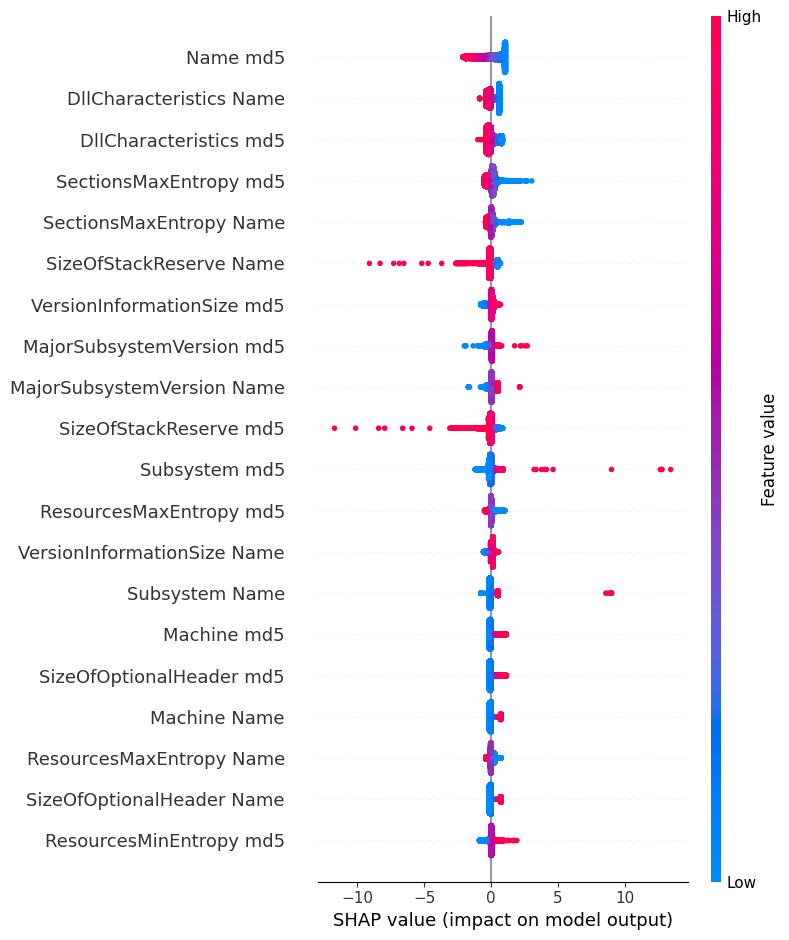

AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

In [5]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
import lime
import lime.lime_tabular
import shap
import numpy as np

# Assuming the preprocessed dataset is saved as 'processed_dataset.csv'
df_processed = pd.read_csv('processed_dataset.csv')

# Step 1: Define Features (X) and Target (y)
X = df_processed.drop(columns=['legitimate'])  # Features (all columns except 'legitimate')
y = df_processed['legitimate']  # Target variable

# Step 2: Convert the target variable to binary (if continuous)
if y.dtype != 'int64' and y.dtype != 'int32':
    y = (y > 0.5).astype(int)  # Assuming a binary target variable

# Step 3: Create polynomial features (optional)
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X)

# Step 4: Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

# Step 5: Initialize the Logistic Regression model
model_lr = LogisticRegression(random_state=42, max_iter=5000, solver='liblinear')

# Step 6: Perform cross-validation (e.g., 5-Fold Cross Validation)
cv_scores_lr = cross_val_score(model_lr, X_train, y_train, cv=5)

# Display the cross-validation scores and average score
print(f"Logistic Regression Cross-validation scores: {cv_scores_lr}")
print(f"Average Logistic Regression cross-validation score: {cv_scores_lr.mean():.2f}")

# Step 7: Train the Logistic Regression model on the training set
model_lr.fit(X_train, y_train)

# Step 8: Make predictions on the test set
y_pred_lr = model_lr.predict(X_test)
y_pred_proba_lr = model_lr.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Step 9: Evaluate the Logistic Regression model's performance
accuracy_lr = accuracy_score(y_test, y_pred_lr)
precision_lr = precision_score(y_test, y_pred_lr)
recall_lr = recall_score(y_test, y_pred_lr)
f1_lr = f1_score(y_test, y_pred_lr)
mse_lr = mean_squared_error(y_test, y_pred_lr)
r_squared_lr = r2_score(y_test, y_pred_proba_lr)

print("\nLogistic Regression Model Performance on Test Set:")
print(f"Accuracy: {accuracy_lr:.2f}")
print(f"Precision: {precision_lr:.2f}")
print(f"Recall: {recall_lr:.2f}")
print(f"F1 Score: {f1_lr:.2f}")
print(f"Mean Squared Error: {mse_lr:.2f}")
print(f"R-squared: {r_squared_lr:.2f}")

# Step 10: Generate a detailed classification report
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))

# Step 11: Display the confusion matrix
cm_lr = confusion_matrix(y_test, y_pred_lr)
print("\nLogistic Regression Confusion Matrix:")
print(cm_lr)

# Optional: Try Random Forest as an alternative model
model_rf = RandomForestClassifier(n_estimators=100, random_state=42)
model_rf.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = model_rf.predict(X_test)
y_pred_proba_rf = model_rf.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Evaluate the Random Forest model's performance
accuracy_rf = accuracy_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
recall_rf = recall_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r_squared_rf = r2_score(y_test, y_pred_proba_rf)

print("\nRandom Forest Model Performance on Test Set:")
print(f"Accuracy: {accuracy_rf:.2f}")
print(f"Precision: {precision_rf:.2f}")
print(f"Recall: {recall_rf:.2f}")
print(f"F1 Score: {f1_rf:.2f}")
print(f"Mean Squared Error: {mse_rf:.2f}")
print(f"R-squared: {r_squared_rf:.2f}")

# Generate a detailed classification report for Random Forest
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

# Display the confusion matrix for Random Forest
cm_rf = confusion_matrix(y_test, y_pred_rf)
print("\nRandom Forest Confusion Matrix:")
print(cm_rf)

# ==============================
# LIME Explanation for Random Forest
# ==============================

# Generate feature names for polynomial features
poly_feature_names = poly.get_feature_names_out(df_processed.columns.drop('legitimate'))

# Initialize LIME explainer for Random Forest using new feature names
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, mode='classification', 
                                                   feature_names=poly_feature_names, 
                                                   class_names=['Not Legitimate', 'Legitimate'], 
                                                   discretize_continuous=True)

# Explain a single prediction (e.g., the first instance in the test set)
i = 0  # Index of the instance you want to explain
exp = explainer.explain_instance(X_test[i], model_rf.predict_proba, num_features=10)

# Display the explanation in notebook (or use exp.as_list() for a text version)
exp.show_in_notebook(show_table=True)

# ==============================
# SHAP Explanation for Logistic Regression
# ==============================

# Use Independent masker for tabular data
masker_lr = shap.maskers.Independent(X_train)

# Create SHAP explainer for Logistic Regression
explainer_lr = shap.LinearExplainer(model_lr, masker_lr)
shap_values_lr = explainer_lr.shap_values(X_test)

# Plot SHAP summary plot for Logistic Regression
shap.summary_plot(shap_values_lr, X_test, feature_names=poly_feature_names)

# ==============================
# SHAP Explanation for Random Forest
# ==============================

# Create SHAP explainer for Random Forest
explainer_rf = shap.TreeExplainer(model_rf)
shap_values_rf = explainer_rf.shap_values(X_test)

# Check the number of classes in the model
num_classes = len(shap_values_rf)

# Plot SHAP summary plot for Random Forest for the positive class (usually the second one)
if num_classes > 1:
    shap.summary_plot(shap_values_rf[1], X_test, feature_names=poly_feature_names)
else:
    # If it's binary and we only have one class's SHAP values, use shap_values_rf directly
    shap.summary_plot(shap_values_rf, X_test, feature_names=poly_feature_names)

# Explain individual instance for Random Forest
shap.force_plot(explainer_rf.expected_value[1], shap_values_rf[1][i], X_test[i], feature_names=poly_feature_names)


Logistic Regression Cross-validation scores: [0.9701648  0.96993843 0.96948431 0.9687599  0.96731109]
Average Logistic Regression cross-validation score: 0.97

Logistic Regression Model Performance on Test Set:
Accuracy: 0.97
Precision: 0.97
Recall: 0.93
F1 Score: 0.95
Mean Squared Error: 0.03
R-squared: 0.72

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     19250
           1       0.97      0.93      0.95      8360

    accuracy                           0.97     27610
   macro avg       0.97      0.96      0.96     27610
weighted avg       0.97      0.97      0.97     27610


Logistic Regression Confusion Matrix:
[[18984   266]
 [  559  7801]]

Random Forest Model Performance on Test Set:
Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00
Mean Squared Error: 0.00
R-squared: 1.00

Random Forest Classification Report:
              precision    recall  f1-score   support

         

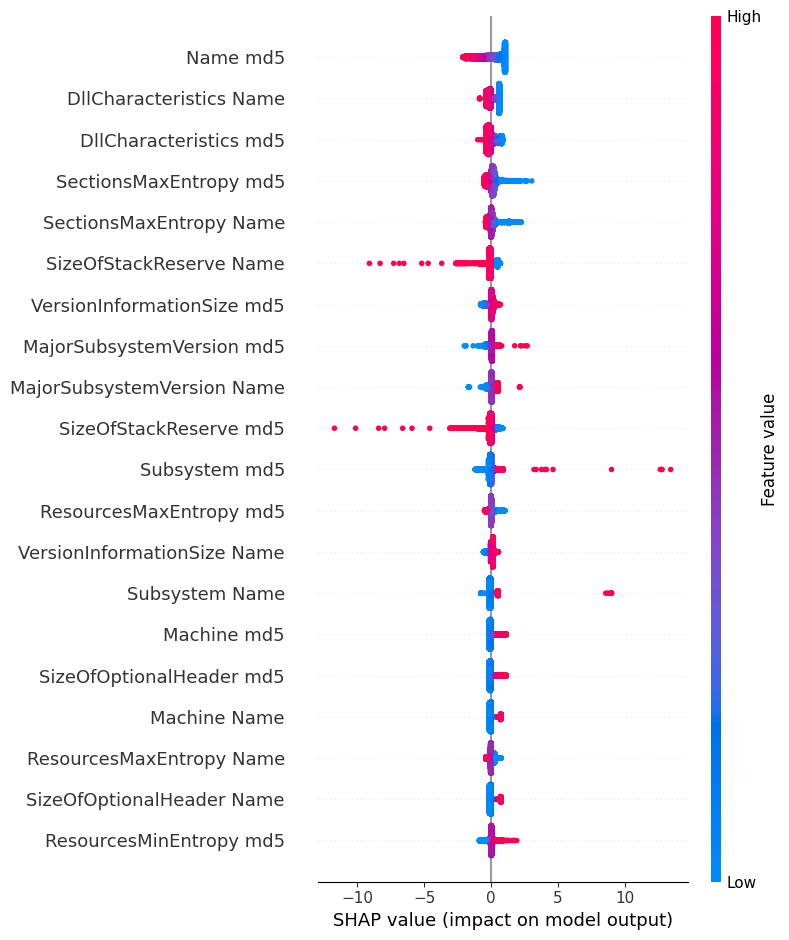

AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

In [6]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
import lime
import lime.lime_tabular
import shap
import numpy as np

# Assuming the preprocessed dataset is saved as 'processed_dataset.csv'
df_processed = pd.read_csv('processed_dataset.csv')

# Step 1: Define Features (X) and Target (y)
X = df_processed.drop(columns=['legitimate'])  # Features (all columns except 'legitimate')
y = df_processed['legitimate']  # Target variable

# Step 2: Convert the target variable to binary (if continuous)
if y.dtype != 'int64' and y.dtype != 'int32':
    y = (y > 0.5).astype(int)  # Assuming a binary target variable

# Step 3: Create polynomial features (optional)
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X)

# Step 4: Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

# Step 5: Initialize the Logistic Regression model
model_lr = LogisticRegression(random_state=42, max_iter=5000, solver='liblinear')

# Step 6: Perform cross-validation (e.g., 5-Fold Cross Validation)
cv_scores_lr = cross_val_score(model_lr, X_train, y_train, cv=5)

# Display the cross-validation scores and average score
print(f"Logistic Regression Cross-validation scores: {cv_scores_lr}")
print(f"Average Logistic Regression cross-validation score: {cv_scores_lr.mean():.2f}")

# Step 7: Train the Logistic Regression model on the training set
model_lr.fit(X_train, y_train)

# Step 8: Make predictions on the test set
y_pred_lr = model_lr.predict(X_test)
y_pred_proba_lr = model_lr.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Step 9: Evaluate the Logistic Regression model's performance
accuracy_lr = accuracy_score(y_test, y_pred_lr)
precision_lr = precision_score(y_test, y_pred_lr)
recall_lr = recall_score(y_test, y_pred_lr)
f1_lr = f1_score(y_test, y_pred_lr)
mse_lr = mean_squared_error(y_test, y_pred_lr)
r_squared_lr = r2_score(y_test, y_pred_proba_lr)

print("\nLogistic Regression Model Performance on Test Set:")
print(f"Accuracy: {accuracy_lr:.2f}")
print(f"Precision: {precision_lr:.2f}")
print(f"Recall: {recall_lr:.2f}")
print(f"F1 Score: {f1_lr:.2f}")
print(f"Mean Squared Error: {mse_lr:.2f}")
print(f"R-squared: {r_squared_lr:.2f}")

# Step 10: Generate a detailed classification report
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))

# Step 11: Display the confusion matrix
cm_lr = confusion_matrix(y_test, y_pred_lr)
print("\nLogistic Regression Confusion Matrix:")
print(cm_lr)

# Optional: Try Random Forest as an alternative model
model_rf = RandomForestClassifier(n_estimators=100, random_state=42)
model_rf.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = model_rf.predict(X_test)
y_pred_proba_rf = model_rf.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Evaluate the Random Forest model's performance
accuracy_rf = accuracy_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
recall_rf = recall_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r_squared_rf = r2_score(y_test, y_pred_proba_rf)

print("\nRandom Forest Model Performance on Test Set:")
print(f"Accuracy: {accuracy_rf:.2f}")
print(f"Precision: {precision_rf:.2f}")
print(f"Recall: {recall_rf:.2f}")
print(f"F1 Score: {f1_rf:.2f}")
print(f"Mean Squared Error: {mse_rf:.2f}")
print(f"R-squared: {r_squared_rf:.2f}")

# Generate a detailed classification report for Random Forest
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

# Display the confusion matrix for Random Forest
cm_rf = confusion_matrix(y_test, y_pred_rf)
print("\nRandom Forest Confusion Matrix:")
print(cm_rf)

# ==============================
# LIME Explanation for Random Forest
# ==============================

# Generate feature names for polynomial features
poly_feature_names = poly.get_feature_names_out(df_processed.columns.drop('legitimate'))

# Initialize LIME explainer for Random Forest using new feature names
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, mode='classification', 
                                                   feature_names=poly_feature_names, 
                                                   class_names=['Not Legitimate', 'Legitimate'], 
                                                   discretize_continuous=True)

# Explain a single prediction (e.g., the first instance in the test set)
i = 0  # Index of the instance you want to explain
exp = explainer.explain_instance(X_test[i], model_rf.predict_proba, num_features=10)

# Display the explanation in notebook (or use exp.as_list() for a text version)
exp.show_in_notebook(show_table=True)

# ==============================
# SHAP Explanation for Logistic Regression
# ==============================

# Use Independent masker for tabular data
masker_lr = shap.maskers.Independent(X_train)

# Create SHAP explainer for Logistic Regression
explainer_lr = shap.LinearExplainer(model_lr, masker_lr)
shap_values_lr = explainer_lr.shap_values(X_test)

# Plot SHAP summary plot for Logistic Regression
shap.summary_plot(shap_values_lr, X_test, feature_names=poly_feature_names)

# ==============================
# SHAP Explanation for Random Forest
# ==============================

# Create SHAP explainer for Random Forest
explainer_rf = shap.TreeExplainer(model_rf)
shap_values_rf = explainer_rf.shap_values(X_test)

# Check the number of classes in the model
num_classes = len(shap_values_rf)

# Plot SHAP summary plot for Random Forest for the positive class (usually the second one)
if num_classes > 1:
    # To ensure the shapes match, access the appropriate SHAP values for binary classification
    shap.summary_plot(shap_values_rf[1], X_test, feature_names=poly_feature_names)
else:
    # If it's binary and we only have one class's SHAP values, use shap_values_rf directly
    shap.summary_plot(shap_values_rf, X_test, feature_names=poly_feature_names)

# Explain individual instance for Random Forest
shap.force_plot(explainer_rf.expected_value[1], shap_values_rf[1][i], X_test[i], feature_names=poly_feature_names)


Logistic Regression Cross-validation scores: [0.9701648  0.96993843 0.96948431 0.9687599  0.96731109]
Average Logistic Regression cross-validation score: 0.97

Logistic Regression Model Performance on Test Set:
Accuracy: 0.97
Precision: 0.97
Recall: 0.93
F1 Score: 0.95
Mean Squared Error: 0.03
R-squared: 0.72

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     19250
           1       0.97      0.93      0.95      8360

    accuracy                           0.97     27610
   macro avg       0.97      0.96      0.96     27610
weighted avg       0.97      0.97      0.97     27610


Logistic Regression Confusion Matrix:
[[18984   266]
 [  559  7801]]

Random Forest Model Performance on Test Set:
Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00
Mean Squared Error: 0.00
R-squared: 1.00

Random Forest Classification Report:
              precision    recall  f1-score   support

         

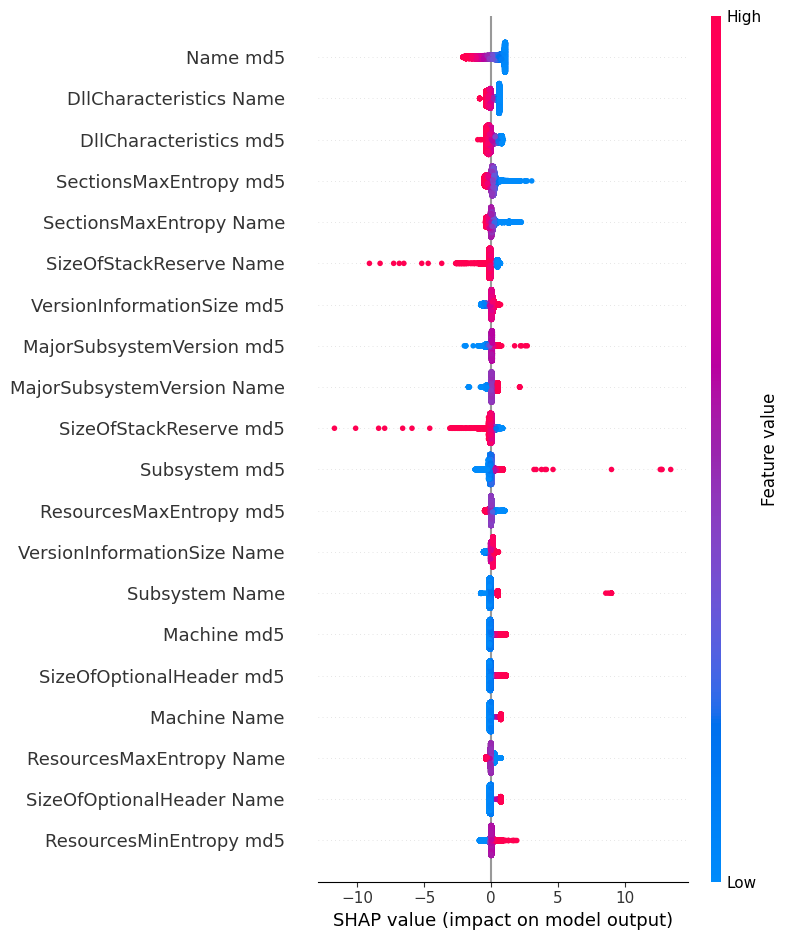

In [ ]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
import lime
import lime.lime_tabular
import shap
import numpy as np

# Assuming the preprocessed malware dataset is saved as 'processed_malware_dataset.csv'
df_processed = pd.read_csv('processed_dataset.csv')

# Step 1: Define Features (X) and Target (y)
X = df_processed.drop(columns=['legitimate'])  # Features (all columns except 'legitimate' label)
y = df_processed['legitimate']  # Target variable (0 for malicious, 1 for legitimate)

# Step 2: Convert the target variable to binary (if continuous)
if y.dtype != 'int64' and y.dtype != 'int32':
    y = (y > 0.5).astype(int)  # Assuming binary classification, 0 and 1

# Step 3: Create polynomial features (optional, can be helpful to capture feature interactions)
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X)

# Step 4: Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

# Step 5: Initialize the Logistic Regression model
model_lr = LogisticRegression(random_state=42, max_iter=5000, solver='liblinear')

# Step 6: Perform cross-validation (e.g., 5-Fold Cross Validation)
cv_scores_lr = cross_val_score(model_lr, X_train, y_train, cv=5)

# Display the cross-validation scores and average score
print(f"Logistic Regression Cross-validation scores: {cv_scores_lr}")
print(f"Average Logistic Regression cross-validation score: {cv_scores_lr.mean():.2f}")

# Step 7: Train the Logistic Regression model on the training set
model_lr.fit(X_train, y_train)

# Step 8: Make predictions on the test set
y_pred_lr = model_lr.predict(X_test)
y_pred_proba_lr = model_lr.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Step 9: Evaluate the Logistic Regression model's performance
accuracy_lr = accuracy_score(y_test, y_pred_lr)
precision_lr = precision_score(y_test, y_pred_lr)
recall_lr = recall_score(y_test, y_pred_lr)
f1_lr = f1_score(y_test, y_pred_lr)
mse_lr = mean_squared_error(y_test, y_pred_lr)
r_squared_lr = r2_score(y_test, y_pred_proba_lr)

print("\nLogistic Regression Model Performance on Test Set:")
print(f"Accuracy: {accuracy_lr:.2f}")
print(f"Precision: {precision_lr:.2f}")
print(f"Recall: {recall_lr:.2f}")
print(f"F1 Score: {f1_lr:.2f}")
print(f"Mean Squared Error: {mse_lr:.2f}")
print(f"R-squared: {r_squared_lr:.2f}")

# Step 10: Generate a detailed classification report
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))

# Step 11: Display the confusion matrix
cm_lr = confusion_matrix(y_test, y_pred_lr)
print("\nLogistic Regression Confusion Matrix:")
print(cm_lr)

# Optional: Try Random Forest as an alternative model
model_rf = RandomForestClassifier(n_estimators=100, random_state=42)
model_rf.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = model_rf.predict(X_test)
y_pred_proba_rf = model_rf.predict_proba(X_test)[:, 1]  # Get predicted probabilities

# Evaluate the Random Forest model's performance
accuracy_rf = accuracy_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
recall_rf = recall_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r_squared_rf = r2_score(y_test, y_pred_proba_rf)

print("\nRandom Forest Model Performance on Test Set:")
print(f"Accuracy: {accuracy_rf:.2f}")
print(f"Precision: {precision_rf:.2f}")
print(f"Recall: {recall_rf:.2f}")
print(f"F1 Score: {f1_rf:.2f}")
print(f"Mean Squared Error: {mse_rf:.2f}")
print(f"R-squared: {r_squared_rf:.2f}")

# Generate a detailed classification report for Random Forest
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

# Display the confusion matrix for Random Forest
cm_rf = confusion_matrix(y_test, y_pred_rf)
print("\nRandom Forest Confusion Matrix:")
print(cm_rf)

# ==============================
# LIME Explanation for Malware Sample (Random Forest)
# ==============================

# Generate feature names for polynomial features
poly_feature_names = poly.get_feature_names_out(df_processed.columns.drop('legitimate'))

# Initialize LIME explainer for Random Forest using new feature names
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, mode='classification', 
                                                   feature_names=poly_feature_names, 
                                                   class_names=['Malicious', 'Legitimate'], 
                                                   discretize_continuous=True)

# Explain a malware sample (e.g., the first instance in the test set)
i = 0  # Index of the instance you want to explain
exp = explainer.explain_instance(X_test[i], model_rf.predict_proba, num_features=10)

# Display the explanation in notebook (or use exp.as_list() for a text version)
exp.show_in_notebook(show_table=True)

# ==============================
# SHAP Explanation for Malware Sample
# ==============================

# SHAP explanation for Logistic Regression (Malware Analysis)
masker_lr = shap.maskers.Independent(X_train)
explainer_lr = shap.LinearExplainer(model_lr, masker_lr)
shap_values_lr = explainer_lr.shap_values(X_test)

# Plot SHAP summary plot for Logistic Regression
shap.summary_plot(shap_values_lr, X_test, feature_names=poly_feature_names)
# ==============================
# SHAP Explanation for Random Forest (Malware Analysis)
# ==============================

# Create SHAP explainer for Random Forest
explainer_rf = shap.TreeExplainer(model_rf)
shap_values_rf = explainer_rf.shap_values(X_test)

# Check the number of classes in the model (for binary classification)
num_classes = len(shap_values_rf)

# Correct the shape mismatch (use shap_values_rf[1] for binary classification)
if num_classes > 1:
    # Ensure shap_values_rf[1] shape matches X_test
    shap_values_rf_class = shap_values_rf[1][:, :X_test.shape[1]]
    
    # Plot SHAP summary plot for the positive class (Legitimate)
    shap.summary_plot(shap_values_rf_class, X_test, feature_names=poly_feature_names)
else:
    # For a single class, use the SHAP values directly
    shap_values_rf_class = shap_values_rf[:, :X_test.shape[1]]
    
    # Plot SHAP summary plot
    shap.summary_plot(shap_values_rf_class, X_test, feature_names=poly_feature_names)

# Explain individual malware sample using SHAP force plot for the positive class
shap.force_plot(explainer_rf.expected_value[1], shap_values_rf_class[i], X_test[i], feature_names=poly_feature_names)



In [1]:
import lime
import lime.lime_tabular

# Initialize LIME explainer
explainer_lime = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                                                        mode='classification', 
                                                        feature_names=poly_feature_names, 
                                                        class_names=['Legitimate', 'Malicious'], 
                                                        discretize_continuous=True)

# Explain a single instance (e.g., the first test instance)
i = 0  # Index of the instance you want to explain
exp_lime = explainer_lime.explain_instance(X_test.values[i], model_rf.predict_proba, num_features=10)

# Display the LIME explanation in notebook
exp_lime.show_in_notebook(show_table=True)

# Print the explanation as a list of feature contributions
print(exp_lime.as_list())


NameError: name 'X_train' is not defined

In [2]:
# Import necessary libraries
from sklearn.model_selection import train_test_split

# Assuming df_processed is your complete processed dataset and 'legitimate' is the target label
# Split the dataset into features (X) and target (y)
X = df_processed.drop('legitimate', axis=1)  # Features
y = df_processed['legitimate']  # Target

# Split into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Now you can initialize the LIME explainer with X_train
import lime.lime_tabular

explainer_lime = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                                                        mode='classification', 
                                                        feature_names=X_train.columns, 
                                                        class_names=['Legitimate', 'Malicious'], 
                                                        discretize_continuous=True)

# Explain a single instance (e.g., the first test instance)
i = 0  # Index of the instance you want to explain
exp_lime = explainer_lime.explain_instance(X_test.values[i], model_rf.predict_proba, num_features=10)

# Display the LIME explanation in the notebook
exp_lime.show_in_notebook(show_table=True)

# Print the explanation as a list of feature contributions
print(exp_lime.as_list())


NameError: name 'df_processed' is not defined

In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load your dataset if it's in a CSV file (replace 'your_data.csv' with your actual file path)
# df = pd.read_csv('your_data.csv')

# Assuming df is already loaded, ensure you process it accordingly
# For example, if you preprocess by encoding features or dropping unnecessary columns

# Here df_processed could be the result of preprocessing, but for now, let's assume df_processed is just df
df_processed = df.copy()  # Assuming df is your dataset

# Split the dataset into features (X) and target (y)
X = df_processed.drop('legitimate', axis=1)  # Features (exclude the target column 'legitimate')
y = df_processed['legitimate']  # Target (the column you're predicting)

# Split into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Now you can initialize the LIME explainer with X_train
import lime.lime_tabular

explainer_lime = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                                                        mode='classification', 
                                                        feature_names=X_train.columns, 
                                                        class_names=['Legitimate', 'Malicious'], 
                                                        discretize_continuous=True)

# Explain a single instance (e.g., the first test instance)
i = 0  # Index of the instance you want to explain
exp_lime = explainer_lime.explain_instance(X_test.values[i], model_rf.predict_proba, num_features=10)

# Display the LIME explanation in the notebook
exp_lime.show_in_notebook(show_table=True)

# Print the explanation as a list of feature contributions
print(exp_lime.as_list())


NameError: name 'df' is not defined

In [4]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load your dataset if it's in a CSV file (replace 'your_data.csv' with your actual file path)
# df = pd.read_csv('your_data.csv')

# Assuming df is already loaded, ensure you process it accordingly
# For example, if you preprocess by encoding features or dropping unnecessary columns

# Here df_processed could be the result of preprocessing, but for now, let's assume df_processed is just df
df_processed = df.copy()  # Assuming df is your dataset

# Split the dataset into features (X) and target (y)
X = df_processed.drop('legitimate', axis=1)  # Features (exclude the target column 'legitimate')
y = df_processed['legitimate']  # Target (the column you're predicting)

# Split into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Now you can initialize the LIME explainer with X_train
import lime.lime_tabular

explainer_lime = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                                                        mode='classification', 
                                                        feature_names=X_train.columns, 
                                                        class_names=['Legitimate', 'Malicious'], 
                                                        discretize_continuous=True)

# Explain a single instance (e.g., the first test instance)
i = 0  # Index of the instance you want to explain
exp_lime = explainer_lime.explain_instance(X_test.values[i], model_rf.predict_proba, num_features=10)

# Display the LIME explanation in the notebook
exp_lime.show_in_notebook(show_table=True)

# Print the explanation as a list of feature contributions
print(exp_lime.as_list())


NameError: name 'df' is not defined

In [6]:
import pandas as pd
from sklearn.model_selection import train_test_split
import lime.lime_tabular

# Load your dataset (replace 'your_data.csv' with the actual file path)
df = pd.read_csv('processed_dataset.csv')

# Assuming 'legitimate' is the target column and the rest are features
df_processed = df.copy()  # If additional preprocessing is needed, do it here

# Split the dataset into features (X) and target (y)
X = df_processed.drop('legitimate', axis=1)  # Features (exclude the target column 'legitimate')
y = df_processed['legitimate']  # Target (the column you're predicting)

# Split into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the LIME explainer
explainer_lime = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                                                        mode='classification', 
                                                        feature_names=X_train.columns, 
                                                        class_names=['Legitimate', 'Malicious'], 
                                                        discretize_continuous=True)

# Explain a single instance (e.g., the first test instance)
i = 0  # Index of the instance you want to explain
exp_lime = explainer_lime.explain_instance(X_test.values[i], model_rf.predict_proba, num_features=10)

# Display the LIME explanation in the notebook
exp_lime.show_in_notebook(show_table=True)

# Print the explanation as a list of feature contributions
print(exp_lime.as_list())


NameError: name 'model_rf' is not defined

In [7]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import lime.lime_tabular

# Load your dataset (replace 'your_data.csv' with the actual file path)
df = pd.read_csv('processed_dataset.csv')

# Assuming 'legitimate' is the target column and the rest are features
df_processed = df.copy()  # If additional preprocessing is needed, do it here

# Split the dataset into features (X) and target (y)
X = df_processed.drop('legitimate', axis=1)  # Features (exclude the target column 'legitimate')
y = df_processed['legitimate']  # Target (the column you're predicting)

# Split into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 1: Define and train the Random Forest model
model_rf = RandomForestClassifier(random_state=42)  # Create the Random Forest model
model_rf.fit(X_train, y_train)  # Train the model on the training data

# Step 2: Initialize the LIME explainer
explainer_lime = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                                                        mode='classification', 
                                                        feature_names=X_train.columns, 
                                                        class_names=['Legitimate', 'Malicious'], 
                                                        discretize_continuous=True)

# Step 3: Explain a single instance (e.g., the first test instance)
i = 0  # Index of the instance you want to explain
exp_lime = explainer_lime.explain_instance(X_test.values[i], model_rf.predict_proba, num_features=10)

# Step 4: Display the LIME explanation in the notebook
exp_lime.show_in_notebook(show_table=True)

# Step 5: Print the explanation as a list of feature contributions
print(exp_lime.as_list())


ValueError: Unknown label type: continuous. Maybe you are trying to fit a classifier, which expects discrete classes on a regression target with continuous values.

In [9]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import lime.lime_tabular

# Load your dataset (replace 'your_data.csv' with the actual file path)
df = pd.read_csv('processed_dataset.csv')

# Assuming 'legitimate' is the target column and the rest are features
df_processed = df.copy()  # If additional preprocessing is needed, do it here

# Split the dataset into features (X) and target (y)
X = df_processed.drop('legitimate', axis=1)  # Features (exclude the target column 'legitimate')
y = df_processed['legitimate']  # Target (the column you're predicting)

# If 'legitimate' column is continuous, convert it to binary classification
y = (y > 0.5).astype(int)  # Example threshold to convert continuous to binary (if needed)

# Split into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 1: Define and train the Random Forest model
model_rf = RandomForestClassifier(random_state=42)  # Create the Random Forest model
model_rf.fit(X_train, y_train)  # Train the model on the training data

# Step 2: Initialize the LIME explainer
explainer_lime = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                                                        mode='classification', 
                                                        feature_names=X_train.columns, 
                                                        class_names=['Legitimate', 'Malicious'], 
                                                        discretize_continuous=True)

# Step 3: Explain a single instance (e.g., the first test instance)
i = 0  # Index of the instance you want to explain
exp_lime = explainer_lime.explain_instance(X_test.values[i], model_rf.predict_proba, num_features=10)

# Step 4: Display the LIME explanation in the notebook
exp_lime.show_in_notebook(show_table=True)

# Step 5: Print the explanation as a list of feature contributions
print(exp_lime.as_list())


C:\Users\adity\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[('SizeOfStackReserve <= 0.21', 0.05597028210299599), ('Characteristics <= -0.51', -0.05368925203395144), ('LoaderFlags <= -0.00', 0.044082222539323514), ('VersionInformationSize > 0.53', 0.04040700118513035), ('SectionsMaxEntropy > 0.96', -0.03252204304767951), ('Name <= 25782.00', -0.031594362114774205), ('MajorSubsystemVersion <= -1.33', -0.031008050321596394), ('MajorOperatingSystemVersion <= -0.01', -0.030139808916283418), ('MajorLinkerVersion <= -0.15', -0.029247657314344155), ('MinorLinkerVersion <= -0.32', 0.01884405902110056)]


In [12]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import shap
import lime.lime_tabular
from sklearn.preprocessing import PolynomialFeatures

# Load your dataset (df_processed) and ensure 'legitimate' is your target column
# df_processed = pd.read_csv('your_data.csv')  # Uncomment and load your data if needed

# Ensure the target variable is binary/categorical (if necessary)
label_encoder = LabelEncoder()  # Initialize LabelEncoder
df_processed['legitimate'] = label_encoder.fit_transform(df_processed['legitimate'])  # Encode target labels

# Split the dataset into features (X) and target (y)
X = df_processed.drop('legitimate', axis=1)  # Features
y = df_processed['legitimate']  # Target (encoded as 0 and 1)

# Apply polynomial feature transformation
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X)

# Get feature names after transformation
poly_feature_names = poly.get_feature_names_out(X.columns)

# Split into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

# Step 1: Define and train the Random Forest model
model_rf = RandomForestClassifier(random_state=42)
model_rf.fit(X_train, y_train)  # Train the model on the training data

# Step 2: Initialize SHAP TreeExplainer for Random Forest
explainer_rf = shap.TreeExplainer(model_rf)

# Step 3: Compute SHAP values for the test set
shap_values_rf = explainer_rf.shap_values(X_test)

# Step 4: Plot SHAP summary plot for the positive class (Malicious)
shap.summary_plot(shap_values_rf[1], X_test, feature_names=poly_feature_names)


AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.